In [46]:
from sklearn.datasets import make_blobs
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import KMeans
import seaborn as sns
from sklearn.metrics import silhouette_score
np.set_printoptions(threshold=np.inf, linewidth=np.inf)

In [20]:
# Configuraciones
seed = 42
np.random.seed(seed)
n_samples = 20000
n_features = 20

# Número aleatorio de clústeres entre 3 y 10
n_clusters = np.random.randint(5, 20)

# Generar desviaciones estándar aleatorias para cada clúster (entre 0.5 y 2.5)
cluster_std = np.random.uniform(0.5, 4, size=n_clusters)

# Generar los datos
X, y = make_blobs(n_samples=n_samples,
                  n_features=n_features,
                  centers=n_clusters,
                  cluster_std=cluster_std,
                  random_state=seed)

# Crear DataFrame
columns = [f"x_{i+1}" for i in range(n_features)]
df = pd.DataFrame(X, columns=columns)
df["label"] = y  # Etiquetas reales (opcional para validación)

# Guardar en CSV
csv_filename = "dataset_sintetico.csv"
df.to_csv(csv_filename, index=False)

print(f"Dataset guardado en {csv_filename} con {n_clusters} clústeres.")


Dataset guardado en dataset_sintetico.csv con 11 clústeres.


In [21]:

data = pd.read_csv("dataset_sintetico.csv")
data

,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,...,x_12,x_13,x_14,x_15,x_16,x_17,x_18,x_19,x_20,label
0,-3.086540,14.974889,3.337097,1.672589,-3.621966,-8.197689,-11.292814,-0.086604,-1.056813,1.051007,...,7.391071,13.744205,-9.230596,-1.758314,-5.609384,-1.262562,2.947967,-8.654437,-4.213401,0
1,-9.388857,3.127890,-4.214727,-0.534625,7.195878,-4.816616,-1.660475,4.372638,-5.003582,-8.110083,...,-6.534563,10.060713,6.591051,2.815465,8.936115,7.075594,-6.962314,7.300467,-0.404483,5
2,9.628573,4.232966,-0.621662,-11.620561,-3.763695,-5.512194,3.463377,3.968174,9.442203,-0.548488,...,0.991252,4.081238,1.076821,2.233358,-2.855027,2.415291,-1.625125,-9.132100,-3.401371,4
3,-5.095940,2.512267,3.401981,0.154113,-8.558415,7.433960,-4.290403,-7.477074,-10.069072,2.414535,...,-11.252125,-0.622263,-6.214398,4.440233,-8.446790,4.647257,-2.263938,8.165995,-5.981221,8
4,-8.023677,4.045680,-4.414667,0.866154,8.141848,-4.242622,-2.765703,4.352313,-4.790277,-8.910723,...,-5.212501,7.796670,5.616629,3.109769,7.585032,5.881076,-5.679003,8.229390,0.683301,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,-7.522121,0.435778,-15.054776,9.549217,-7.346569,2.611656,-2.224352,-4.816679,2.437640,-5.491999,...,3.441000,12.382374,8.881036,-0.335776,4.015662,-9.978465,-3.268802,-7.656933,-10.421616,2
19996,5.839585,1.486197,-0.404434,-7.060095,-1.882613,-3.616050,3.714871,2.381064,8.054745,-0.134670,...,3.156418,5.180551,0.241093,4.192751,3.409737,4.879768,2.697244,-10.004394,-8.603877,4
19997,-3.599616,4.240337,3.526804,1.551302,-7.653407,5.078605,-3.578365,-5.289992,-9.516046,2.517622,...,-9.833145,1.456936,-6.076332,3.556977,-6.395454,3.893093,-3.455030,8.213016,-6.122723,8
19998,-1.468310,-7.732807,6.774319,-2.646021,-3.095498,0.117717,-11.244999,7.051862,-9.894104,5.761697,...,-4.035876,-8.516946,5.594200,4.487141,7.010996,1.463885,-7.471617,-4.994276,-7.373646,3


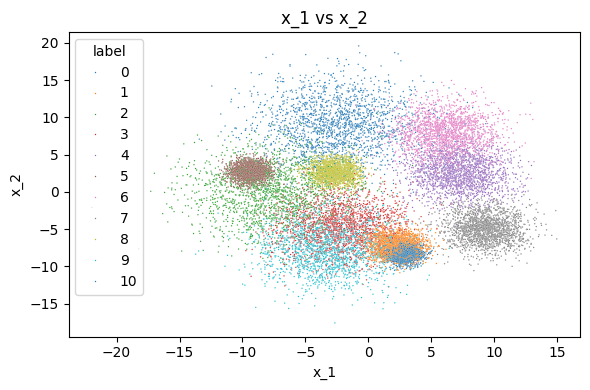

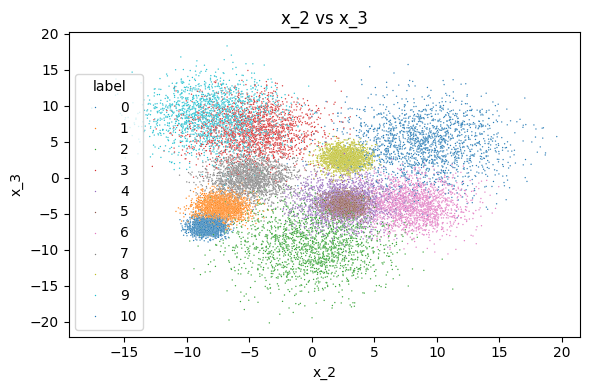

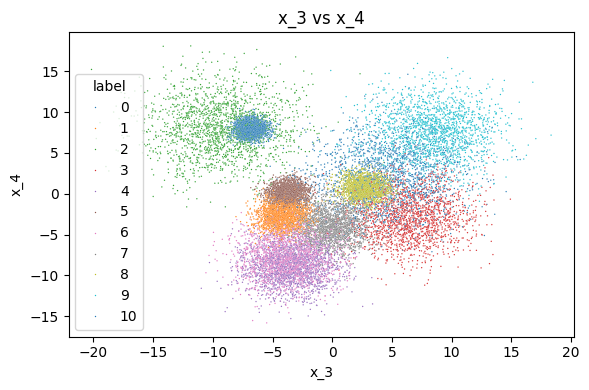

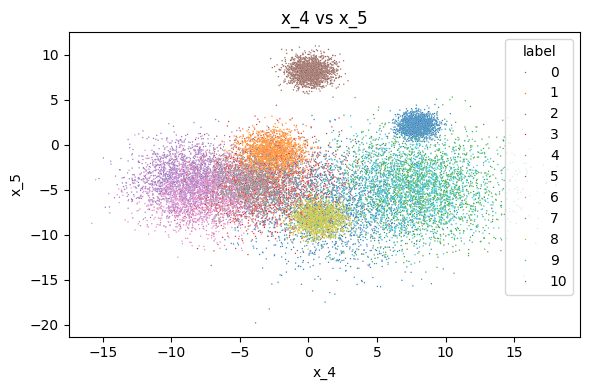

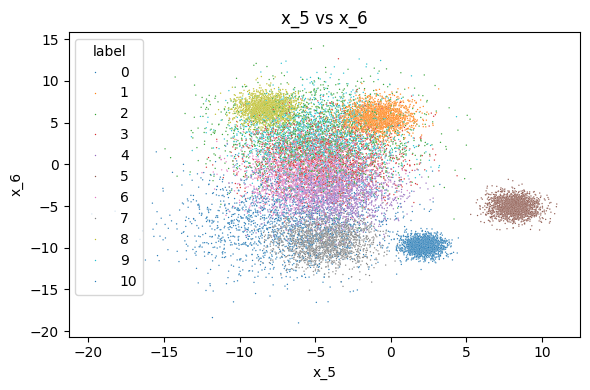

...

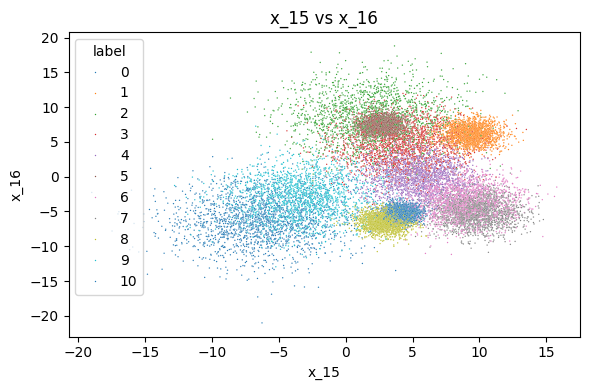

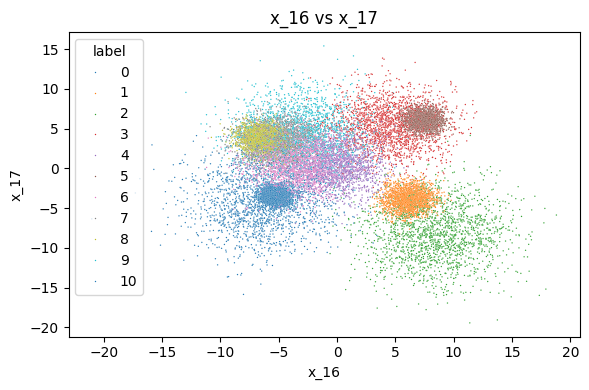

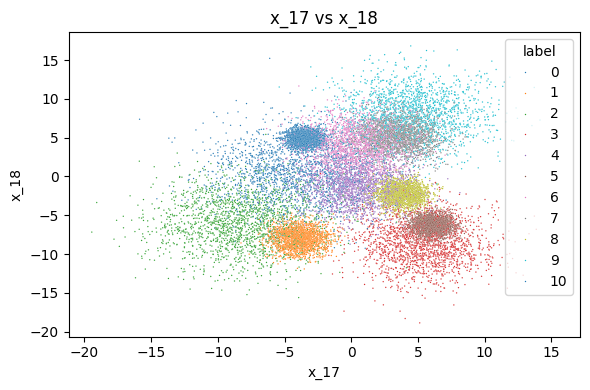

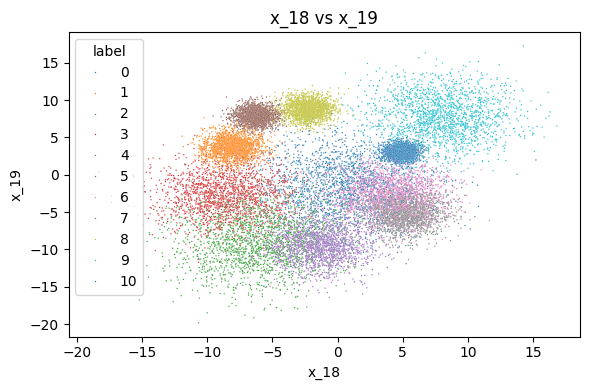

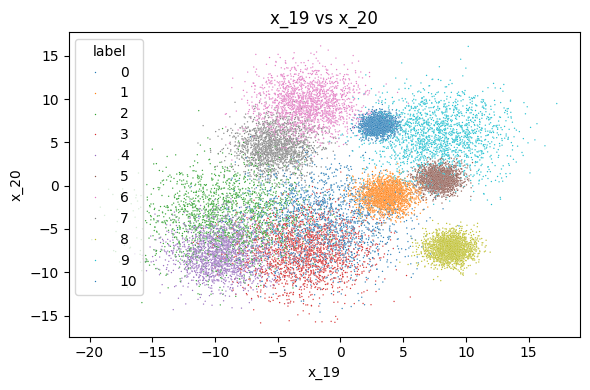

In [ ]:
df = pd.read_csv("dataset_sintetico.csv")

n_features = 20

for i in range(n_features - 1):
    x_col = f"x_{i+1}"
    y_col = f"x_{i+2}"
    
    plt.figure(figsize=(6, 4))
    sns.scatterplot(data=df, x=x_col, y=y_col, hue="label", palette="tab10", s=1)
    plt.title(f"{x_col} vs {y_col}")
    plt.tight_layout()
    plt.show()


In [30]:
k = 11
kmeans = KMeans(n_clusters=k, random_state=42)
y_pred = kmeans.fit_predict(X)
y_pred

array([7, 4, 3, ..., 5, 9, 6])

In [33]:
kmeans.cluster_centers_

array([[-2.90969709e+00, -7.75054261e+00,  9.55861756e+00,  7.15213424e+00, -4.41629155e+00,  3.00586970e+00,  5.78343197e+00,  6.54924543e-04,  7.65722780e-01, -4.71726122e+00, -8.85936762e+00,  8.33136657e+00,  7.62127933e+00,  2.79294364e+00, -2.80821672e+00, -3.10924508e+00,  3.84217457e+00,  7.62417572e+00,  8.63855112e+00,  6.23012379e+00],
       [ 7.70764622e+00,  1.49765366e+00, -1.92414272e+00, -5.87709283e+00, -4.91697454e+00, -5.30808327e+00,  4.23862433e+00,  3.59370499e+00, -9.43342205e+00, -2.07413460e+00,  3.28279367e+00, -5.41174778e+00, -7.40297080e+00, -1.73530332e+00,  9.29827317e+00, -4.33336384e+00,  1.97849509e+00,  4.60889650e+00, -3.90421475e+00,  6.98978847e+00],
       [-7.60119321e+00, -3.09957378e-02, -9.27933352e+00,  8.10679259e+00, -4.81903940e+00,  3.27932670e+00, -3.73243845e+00,  3.44476495e-01,  1.08043645e+00, -6.30115053e+00,  9.43841089e+00,  5.59810432e+00,  8.69257423e+00,  7.90219786e+00,  2.00002667e+00,  8.48280612e+00, -8.22686632e+00, -6.08

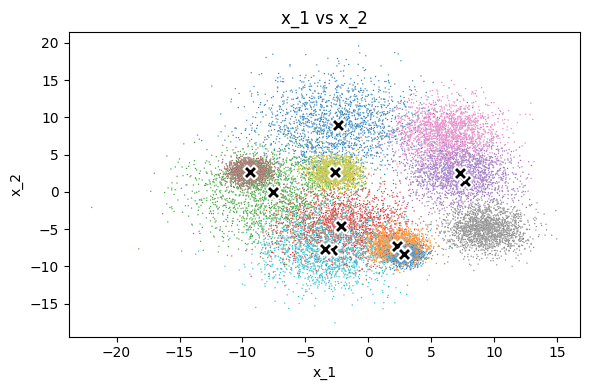

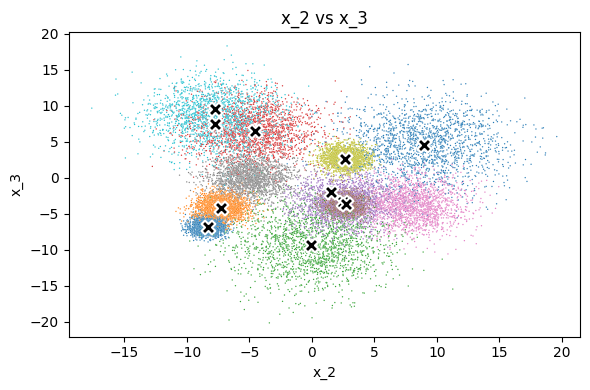

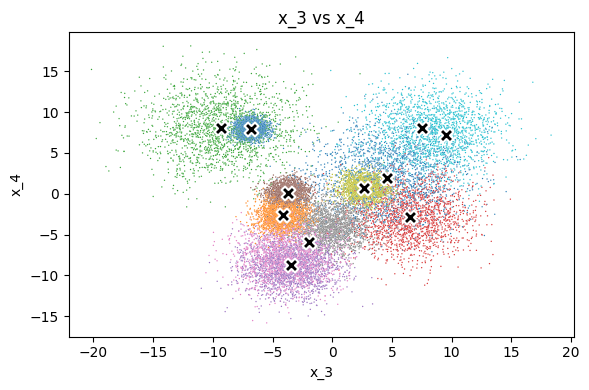

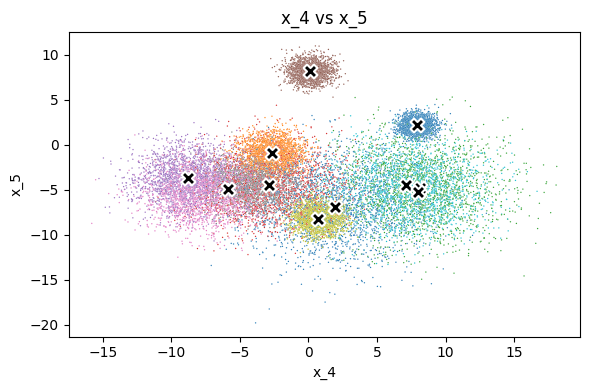

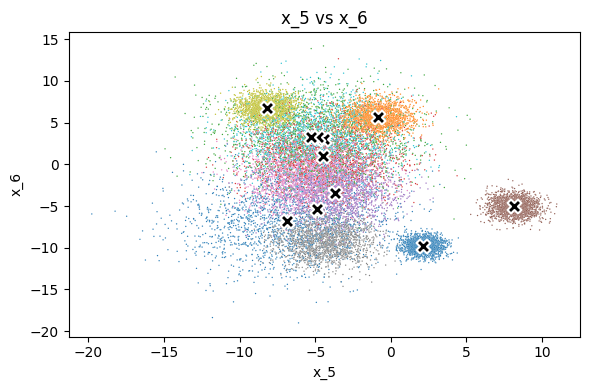

...

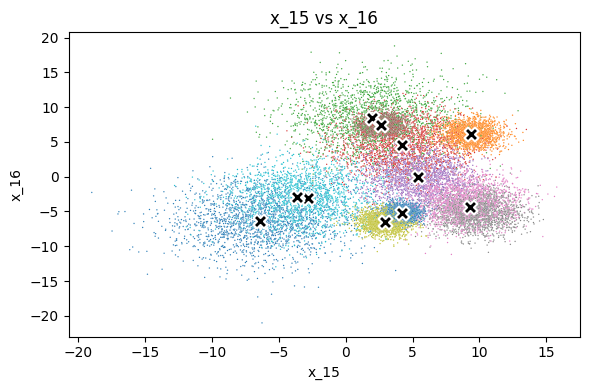

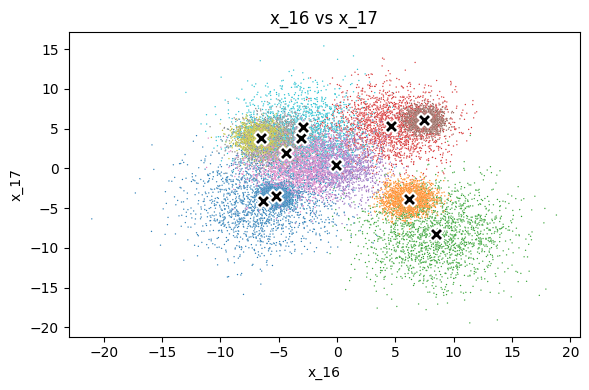

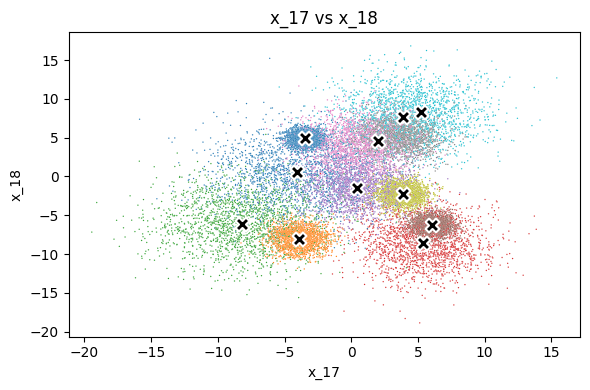

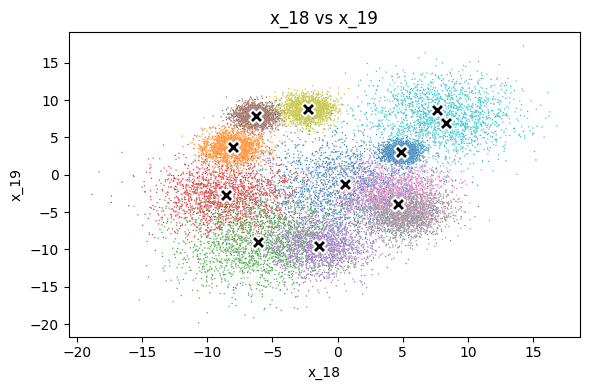

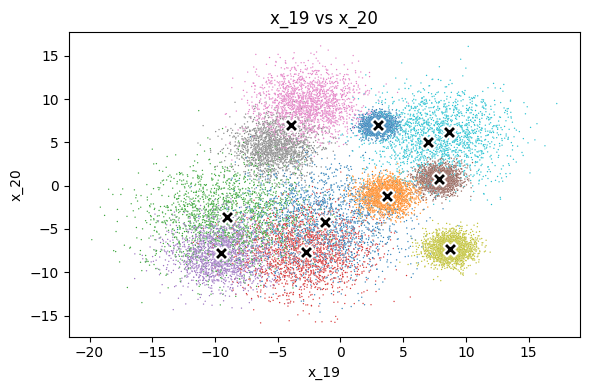

In [79]:
centers = kmeans.cluster_centers_

for i in range(n_features - 1):
    x_col = f"x_{i+1}"
    y_col = f"x_{i+2}"
    
    plt.figure(figsize=(6, 4))
    sns.scatterplot(data=df, x=x_col, y=y_col, hue="label", palette="tab10", s=1, legend=False)

    # Graficar centros del clúster
    plt.scatter(
        centers[:, i], centers[:, i+1],
        c='black', s=100, marker='X', edgecolor='white', linewidth=1.5, label='Centros'
    )

    plt.title(f"{x_col} vs {y_col}")
    plt.tight_layout()
    plt.show()

In [77]:
x_test = np.array([2, 4, 5, 7, -3, 5, 8, 4, -4, -2, -4, -5, -6, 3, -4, -5, -3, 4, 5, 6])
kmeans.predict([x_test])

array([10])

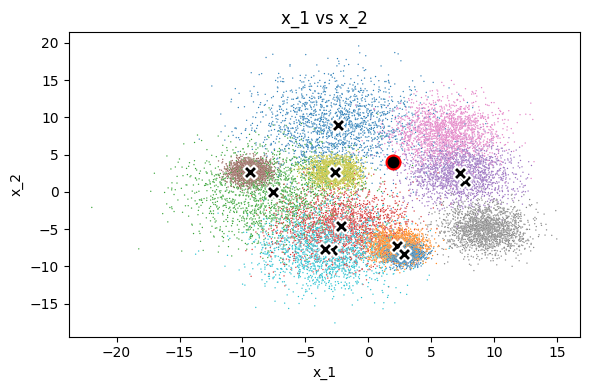

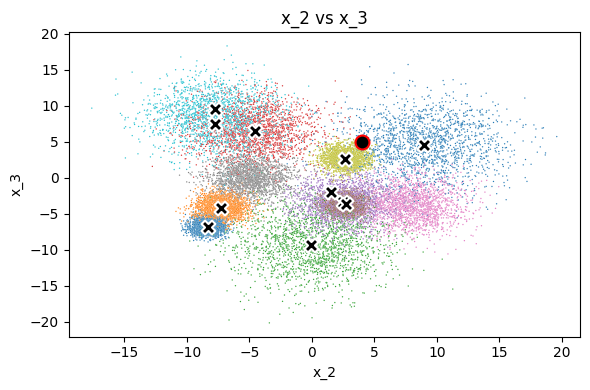

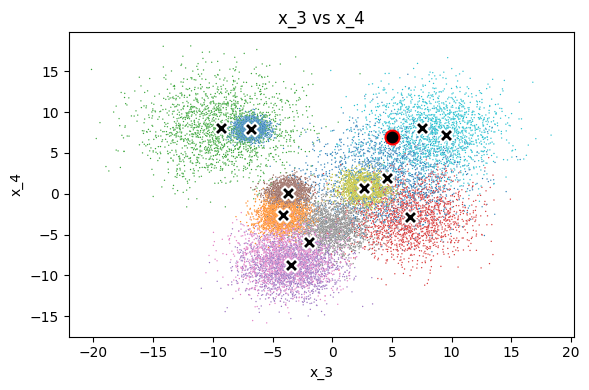

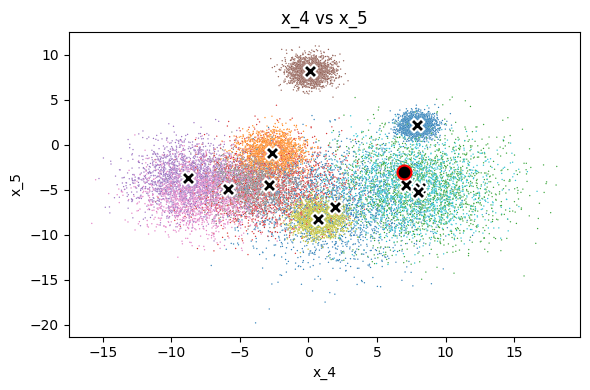

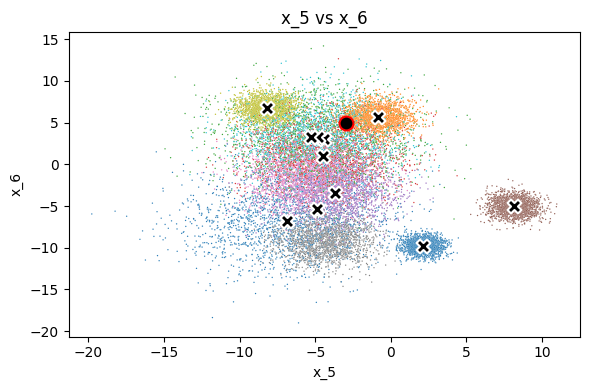

...

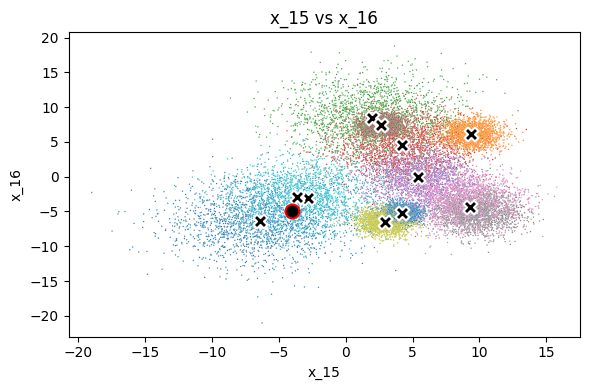

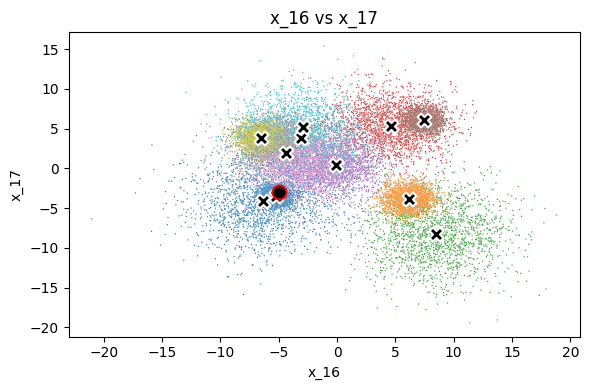

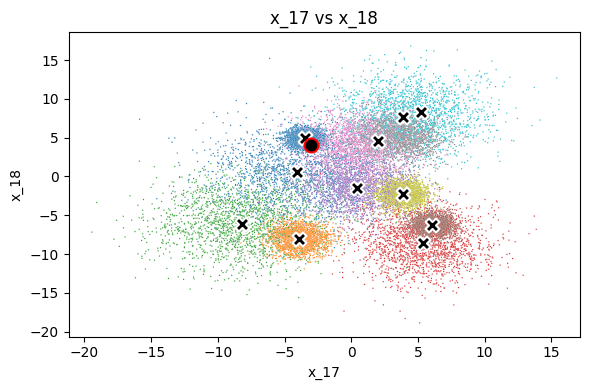

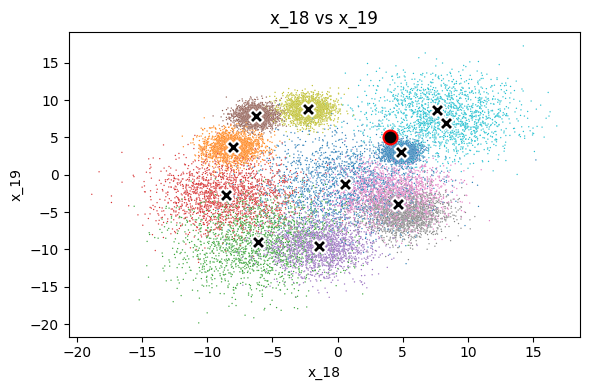

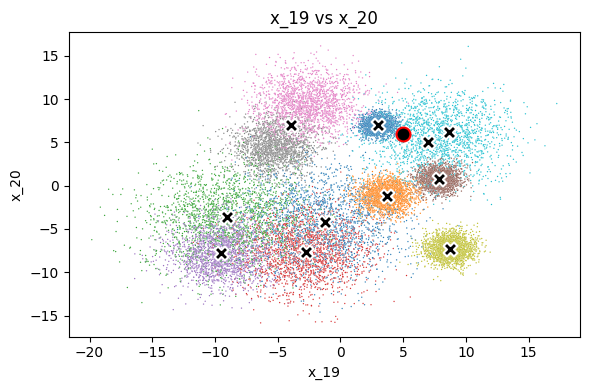

In [80]:
for i in range(n_features - 1):
    x_col = f"x_{i+1}"
    y_col = f"x_{i+2}"
    
    plt.figure(figsize=(6, 4))
    sns.scatterplot(data=df, x=x_col, y=y_col, hue="label", palette="tab10", s=1, legend=False)

    plt.scatter(
        centers[:, i], centers[:, i+1],
        c='black', s=100, marker='X', edgecolor='white', linewidth=1.5, label='Centros'
    )

    plt.scatter(
        x_test[i], x_test[i+1],
        c='black', s=100, marker='o', edgecolor='red', linewidth=1.5
    )

    plt.title(f"{x_col} vs {y_col}")
    plt.tight_layout()
    plt.show()

In [47]:
silhouette_score(X, kmeans.labels_)

0.5551644336516494

In [56]:
kmeans_per_k = [KMeans(n_clusters=k, random_state=42).fit(X) for k in range(5, 20)]

silhouette_scores = [silhouette_score(X, model.labels_) for model in kmeans_per_k[:]]

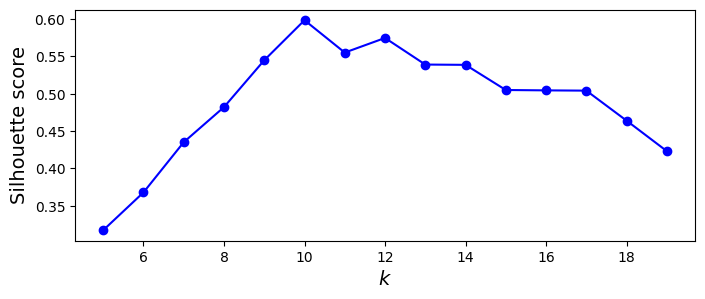

In [57]:
plt.figure(figsize=(8, 3))
plt.plot(range(5, 20), silhouette_scores, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Silhouette score", fontsize=14)
plt.show()

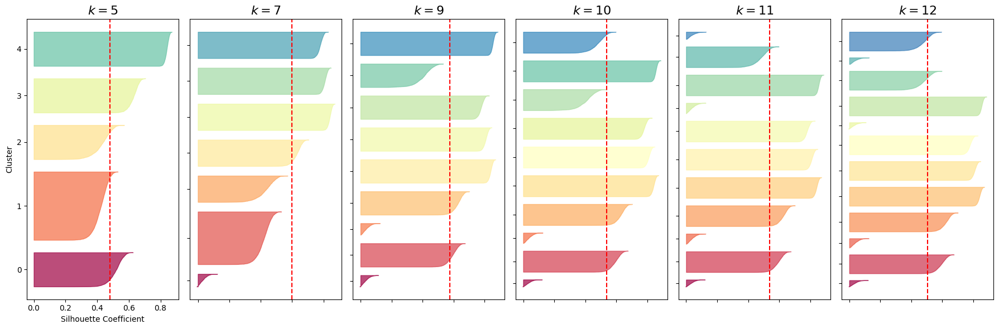

In [69]:
from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter
import matplotlib as mpl

fig, axes = plt.subplots(1, 6, figsize=(18, 6))  # 1 fila, 3 columnas

for ax, k in zip(axes, (5, 7, 9, 10, 11, 12)):
    y_pred = kmeans_per_k[k - 1].labels_
    silhouette_coefficients = silhouette_samples(X, y_pred)

    padding = len(X) // 30
    pos = padding
    ticks = []
    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()

        color = mpl.cm.Spectral(i / k)
        ax.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                         facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    ax.yaxis.set_major_locator(FixedLocator(ticks))
    ax.yaxis.set_major_formatter(FixedFormatter(range(k)))
    ax.set_title(f"$k={k}$", fontsize=16)
    ax.axvline(x=silhouette_scores[k - 2], color="red", linestyle="--")
    
    if k == 5:
        ax.set_ylabel("Cluster")
        ax.set_xlabel("Silhouette Coefficient")
    else:
        ax.set_yticklabels([])
        ax.set_xticklabels([])

plt.tight_layout()
plt.show()
